In [1]:
from typing import List
import numpy as np
import pandas as pd
from experiments.common import run_increasing_size_neighborhoods_experiments
from experiments.data.synthetic_normal_benchmarks import (
    benchmark_curve_1,
    benchmark_curve_2,
    benchmark_curve_3,
    benchmark_curve_4,
    benchmark_curve_5,
)

%load_ext autoreload
%autoreload 2

# Experiments in dense homoscedastic Gaussian settings with increasing window size
The following are plots and metrics for a number of experimental settings with dense homoscedastic curves and additive i.i.d. Gaussian noise comparing the proposed Robust Local Polynomial Regression with Similarity Kernels method with LOWESS, robust LOWESS, kernel regression, local polynomial and RBF network regression. The plots are interactive and allows to hide and show different elements by clicking or double-clicking as well as to zoom in on areas of interest.

In [2]:
extreme_noise_ratio: float = 0.95
high_noise_ratio: float = 0.65
medium_noise_ratio: float = 0.35
mild_noise_ratio: float = 0.15
hetero: bool = False
num_points: int = 150

size_neighborhoods: List[int] = [5, 7, 9, 11, 13, 15] + np.linspace(
    start=20, stop=num_points, num=10, endpoint=True
).astype(int).tolist()


def bw1_f(data: np.ndarray) -> List[float]:
    return [float(1 / np.clip(a=0.1 * data.shape[0], a_min=2.0, a_max=27.0))] * data.shape[1]


methods: List[str] = [
    "rsklpr",
    "rsklpr_quad",
    "lowess",
    "robust_lowess",
    "kernel_reg_ll",
    "kernel_reg_lc",
    "local_quad",
    "rbfnet",
]

## Curve 1

### Mild noise

Best performing method is rsklpr for size_neighborhood w_20


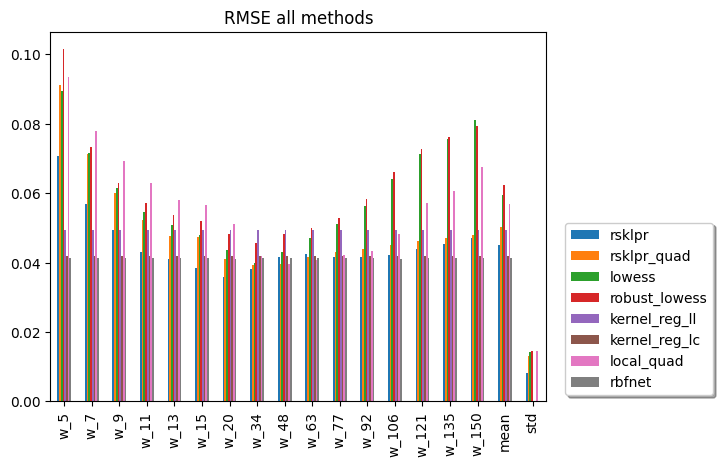

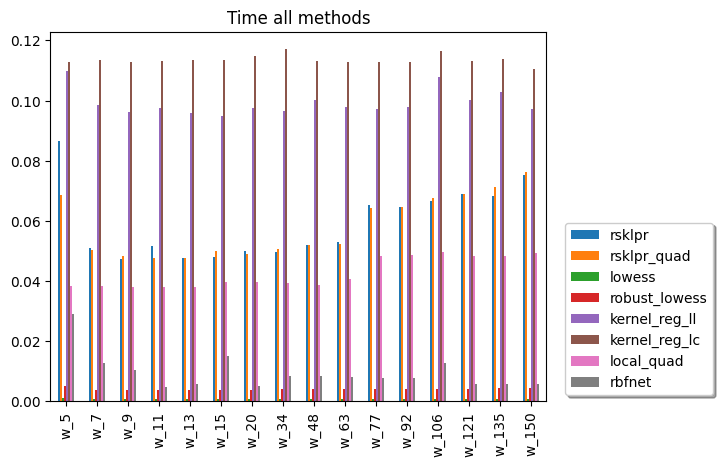

In [3]:
best_for_window: pd.DataFrame
worst_for_window: pd.DataFrame

best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_1,
    noise_ratio=mild_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    k2="joint",
    methods=methods,
)

In [4]:
best_for_window

,method,rmse
w_5,rbfnet,0.041282
w_7,rbfnet,0.041216
w_9,rbfnet,0.041286
w_11,rbfnet,0.041209
w_13,rsklpr,0.041118
w_15,rsklpr,0.038561
w_20,rsklpr,0.035863
w_34,rsklpr,0.038077
w_48,rsklpr_quad,0.039489
w_63,local_quad,0.040754


In [5]:
worst_for_window

,method,rmse
w_5,robust_lowess,0.101410
w_7,local_quad,0.077991
w_9,local_quad,0.069212
w_11,local_quad,0.062981
w_13,local_quad,0.058008
w_15,local_quad,0.056690
w_20,local_quad,0.051082
w_34,kernel_reg_ll,0.049255
w_48,kernel_reg_ll,0.049255
w_63,robust_lowess,0.049961


### Medium noise

Best performing method is kernel_reg_lc for size_neighborhood w_5


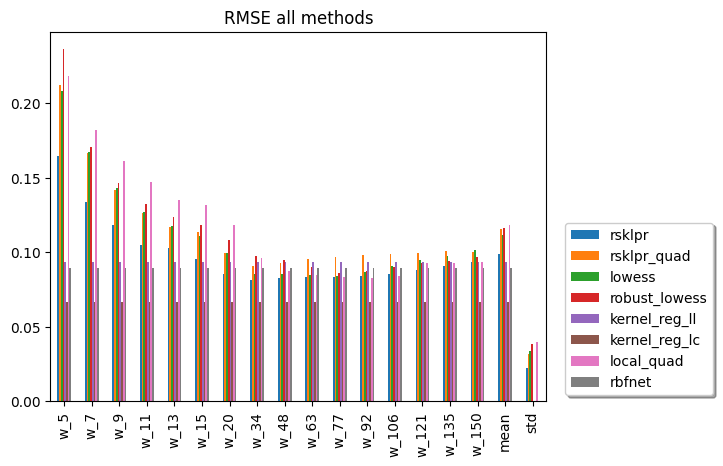

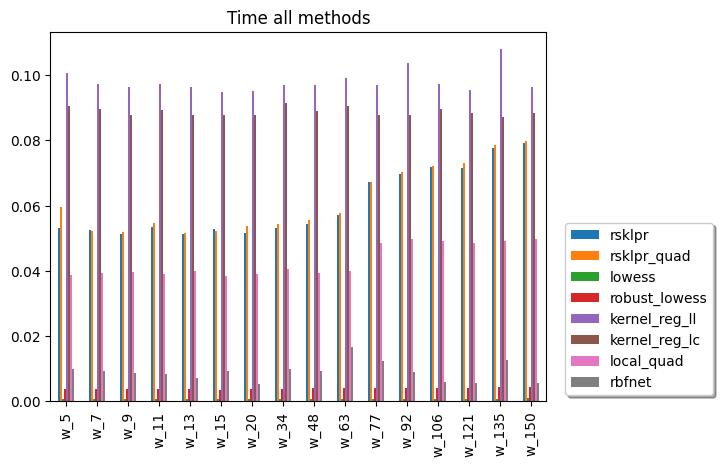

In [6]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_1,
    noise_ratio=medium_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    k2="joint",
    methods=methods,
)

In [7]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.066849
w_7,kernel_reg_lc,0.066849
w_9,kernel_reg_lc,0.066849
w_11,kernel_reg_lc,0.066849
w_13,kernel_reg_lc,0.066849
w_15,kernel_reg_lc,0.066849
w_20,kernel_reg_lc,0.066849
w_34,kernel_reg_lc,0.066849
w_48,kernel_reg_lc,0.066849
w_63,kernel_reg_lc,0.066849


In [8]:
worst_for_window

,method,rmse
w_5,robust_lowess,0.236183
w_7,local_quad,0.181981
w_9,local_quad,0.161487
w_11,local_quad,0.146983
w_13,local_quad,0.135258
w_15,local_quad,0.132105
w_20,local_quad,0.118572
w_34,robust_lowess,0.097513
w_48,robust_lowess,0.094839
w_63,rsklpr_quad,0.095843


### High noise

Best performing method is kernel_reg_lc for size_neighborhood w_5


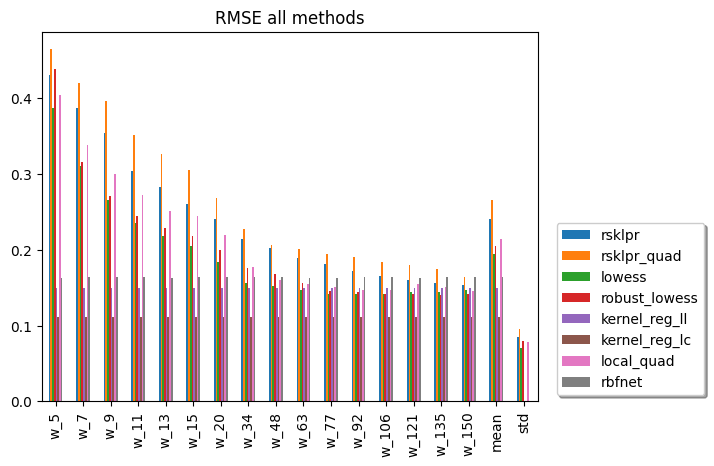

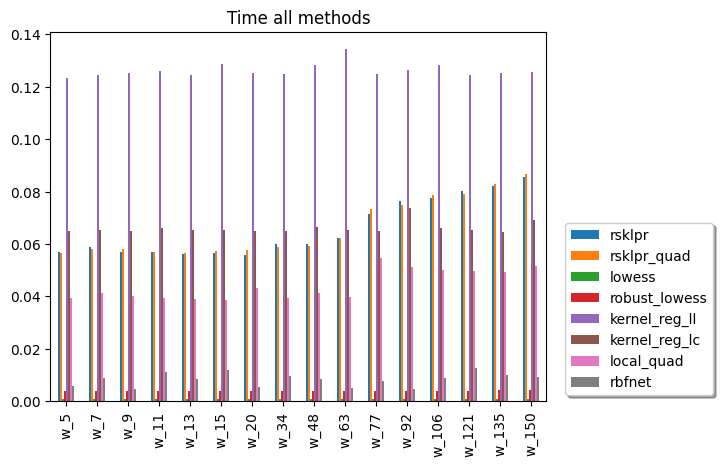

In [9]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_1,
    noise_ratio=high_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1="normal_reference",
    bw2="normal_reference",
    k2="joint",
    methods=methods,
)

In [10]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.111041
w_7,kernel_reg_lc,0.111041
w_9,kernel_reg_lc,0.111041
w_11,kernel_reg_lc,0.111041
w_13,kernel_reg_lc,0.111041
w_15,kernel_reg_lc,0.111041
w_20,kernel_reg_lc,0.111041
w_34,kernel_reg_lc,0.111041
w_48,kernel_reg_lc,0.111041
w_63,kernel_reg_lc,0.111041


In [11]:
worst_for_window

,method,rmse
w_5,rsklpr_quad,0.464758
w_7,rsklpr_quad,0.420564
w_9,rsklpr_quad,0.396641
w_11,rsklpr_quad,0.351439
w_13,rsklpr_quad,0.326641
w_15,rsklpr_quad,0.305814
w_20,rsklpr_quad,0.268569
w_34,rsklpr_quad,0.228173
w_48,rsklpr_quad,0.206570
w_63,rsklpr_quad,0.200628


### Extreme noise

Best performing method is kernel_reg_lc for size_neighborhood w_5


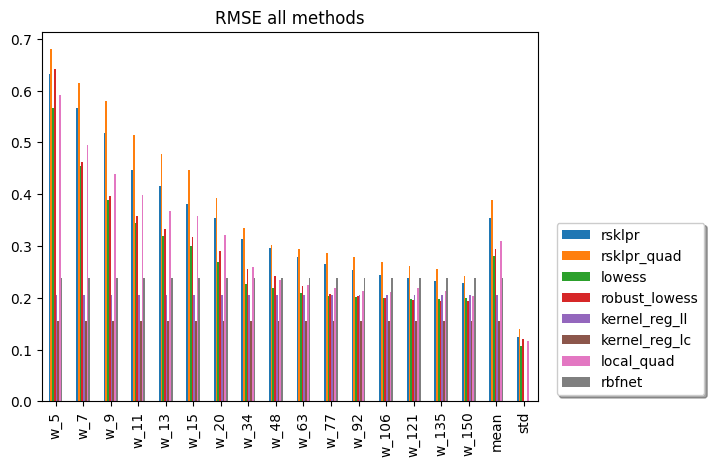

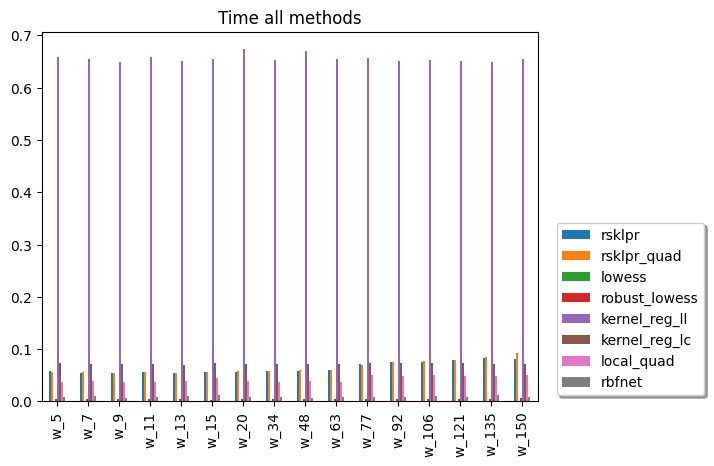

In [12]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_1,
    noise_ratio=extreme_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1="normal_reference",
    bw2="normal_reference",
    k2="joint",
    methods=methods,
)

In [13]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.155095
w_7,kernel_reg_lc,0.155095
w_9,kernel_reg_lc,0.155095
w_11,kernel_reg_lc,0.155095
w_13,kernel_reg_lc,0.155095
w_15,kernel_reg_lc,0.155095
w_20,kernel_reg_lc,0.155095
w_34,kernel_reg_lc,0.155095
w_48,kernel_reg_lc,0.155095
w_63,kernel_reg_lc,0.155095


In [14]:
worst_for_window

,method,rmse
w_5,rsklpr_quad,0.679388
w_7,rsklpr_quad,0.614692
w_9,rsklpr_quad,0.579646
w_11,rsklpr_quad,0.513302
w_13,rsklpr_quad,0.477852
w_15,rsklpr_quad,0.447559
w_20,rsklpr_quad,0.392999
w_34,rsklpr_quad,0.334357
w_48,rsklpr_quad,0.302733
w_63,rsklpr_quad,0.294324


## Curve 2

### Mild noise

Best performing method is local_quad for size_neighborhood w_48


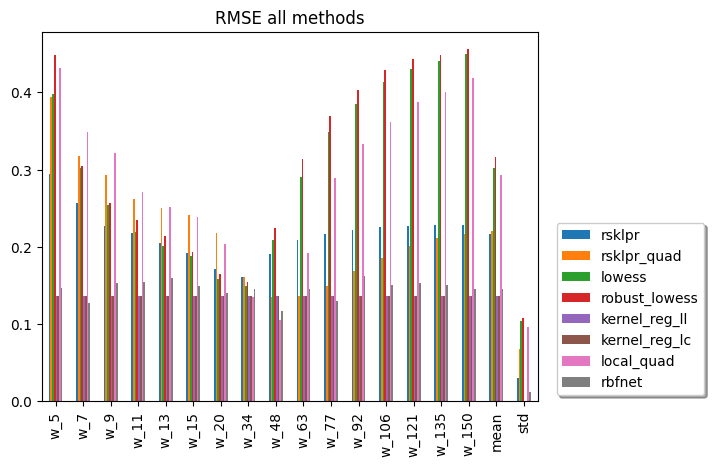

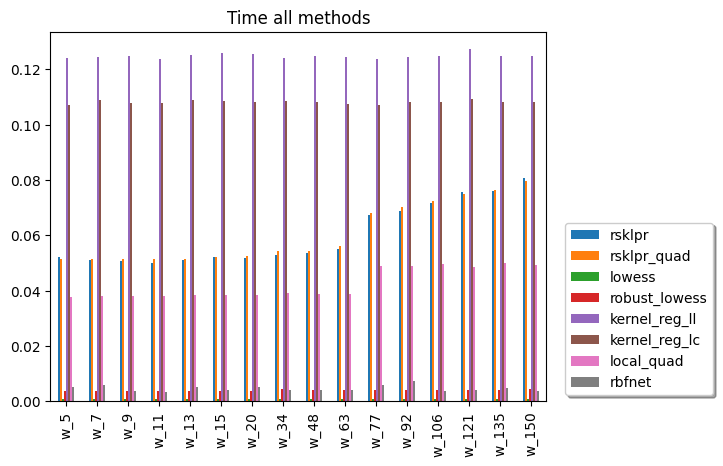

In [15]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_2,
    noise_ratio=mild_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    k2="joint",
    methods=methods,
)

In [16]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.136609
w_7,rbfnet,0.127453
w_9,kernel_reg_lc,0.136609
w_11,kernel_reg_lc,0.136609
w_13,kernel_reg_lc,0.136609
w_15,kernel_reg_lc,0.136609
w_20,kernel_reg_lc,0.136609
w_34,local_quad,0.134487
w_48,local_quad,0.105353
w_63,rsklpr_quad,0.136571


In [17]:
worst_for_window

,method,rmse
w_5,robust_lowess,0.448526
w_7,local_quad,0.348784
w_9,local_quad,0.321750
w_11,local_quad,0.271616
w_13,local_quad,0.251364
w_15,rsklpr_quad,0.240981
w_20,rsklpr_quad,0.218071
w_34,rsklpr_quad,0.161027
w_48,robust_lowess,0.224056
w_63,robust_lowess,0.313254


### Medium noise

Best performing method is local_quad for size_neighborhood w_48


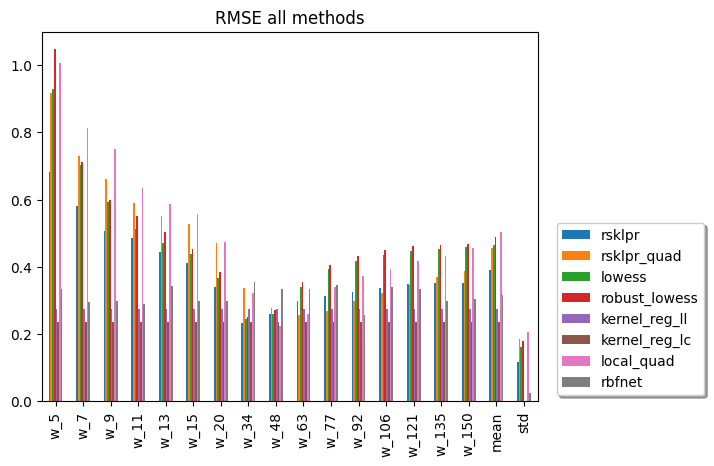

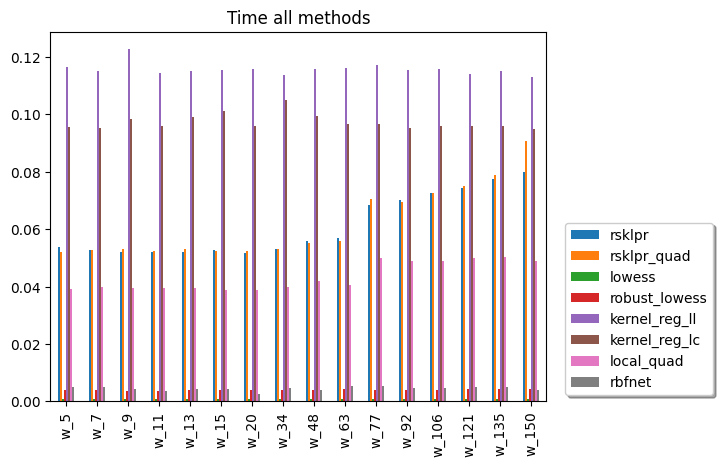

In [18]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_2,
    noise_ratio=medium_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    k2="joint",
    methods=methods,
)

In [19]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.234775
w_7,kernel_reg_lc,0.234775
w_9,kernel_reg_lc,0.234775
w_11,kernel_reg_lc,0.234775
w_13,kernel_reg_lc,0.234775
w_15,kernel_reg_lc,0.234775
w_20,kernel_reg_lc,0.234775
w_34,rsklpr,0.234221
w_48,local_quad,0.224320
w_63,kernel_reg_lc,0.234775


In [20]:
worst_for_window

,method,rmse
w_5,robust_lowess,1.046190
w_7,local_quad,0.813795
w_9,local_quad,0.750738
w_11,local_quad,0.633369
w_13,local_quad,0.585722
w_15,local_quad,0.557654
w_20,local_quad,0.474286
w_34,rbfnet,0.354968
w_48,rbfnet,0.332960
w_63,robust_lowess,0.354007


### High noise

Best performing method is kernel_reg_lc for size_neighborhood w_5


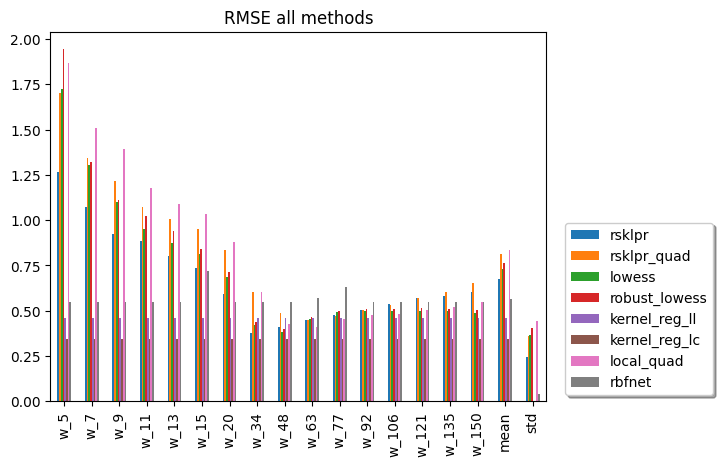

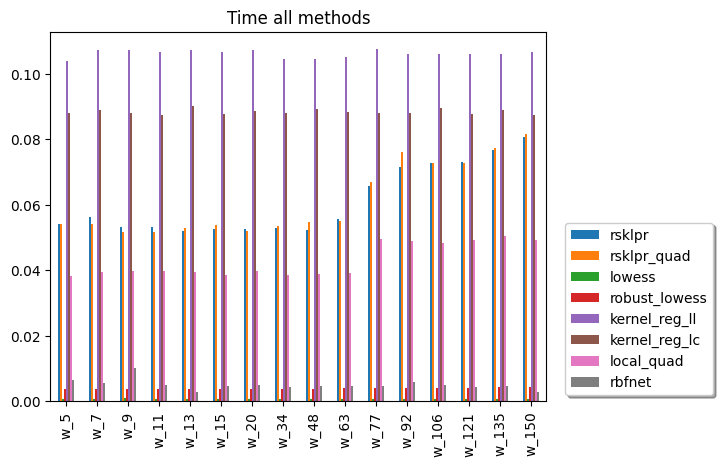

In [21]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_2,
    noise_ratio=high_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    k2="joint",
    methods=methods,
)

In [22]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.346692
w_7,kernel_reg_lc,0.346692
w_9,kernel_reg_lc,0.346692
w_11,kernel_reg_lc,0.346692
w_13,kernel_reg_lc,0.346692
w_15,kernel_reg_lc,0.346692
w_20,kernel_reg_lc,0.346692
w_34,kernel_reg_lc,0.346692
w_48,kernel_reg_lc,0.346692
w_63,kernel_reg_lc,0.346692


In [23]:
worst_for_window

,method,rmse
w_5,robust_lowess,1.942494
w_7,local_quad,1.511312
w_9,local_quad,1.394221
w_11,local_quad,1.176008
w_13,local_quad,1.087278
w_15,local_quad,1.035328
w_20,local_quad,0.879966
w_34,local_quad,0.601967
w_48,rbfnet,0.550634
w_63,rbfnet,0.568438


### Extreme noise

Best performing method is kernel_reg_lc for size_neighborhood w_5


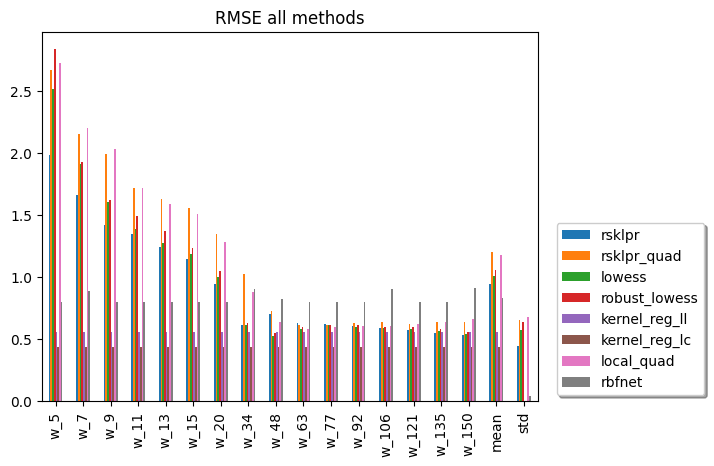

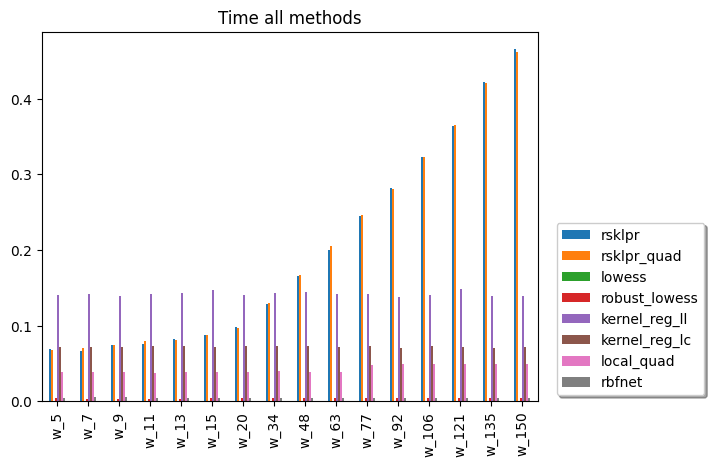

In [24]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_2,
    noise_ratio=extreme_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    k2="conden",
    methods=methods,
)

In [25]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.438252
w_7,kernel_reg_lc,0.438252
w_9,kernel_reg_lc,0.438252
w_11,kernel_reg_lc,0.438252
w_13,kernel_reg_lc,0.438252
w_15,kernel_reg_lc,0.438252
w_20,kernel_reg_lc,0.438252
w_34,kernel_reg_lc,0.438252
w_48,kernel_reg_lc,0.438252
w_63,kernel_reg_lc,0.438252


In [26]:
worst_for_window

,method,rmse
w_5,robust_lowess,2.838808
w_7,local_quad,2.208829
w_9,local_quad,2.037704
w_11,rsklpr_quad,1.718979
w_13,rsklpr_quad,1.635937
w_15,rsklpr_quad,1.561733
w_20,rsklpr_quad,1.351514
w_34,rsklpr_quad,1.026885
w_48,rbfnet,0.824426
w_63,rbfnet,0.804979


## Curve 3

### Mild noise

Best performing method is local_quad for size_neighborhood w_77


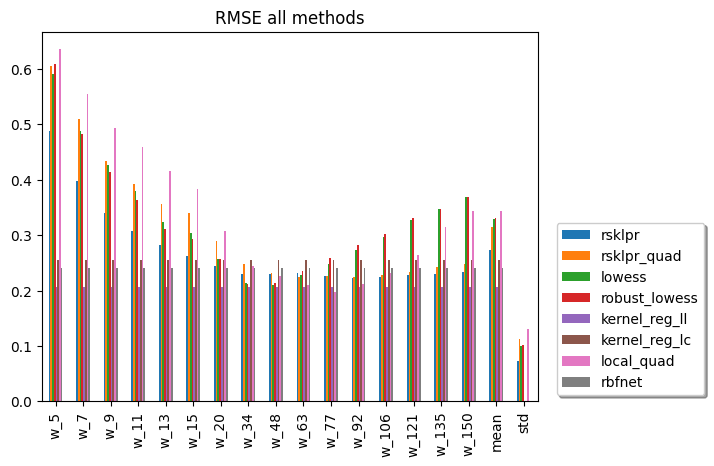

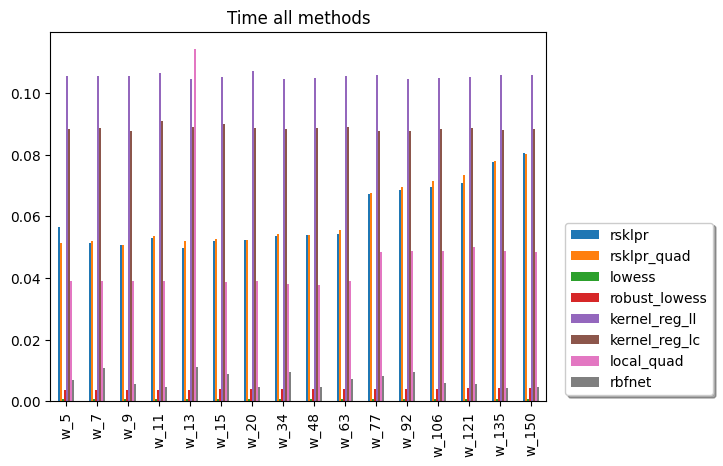

In [27]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_3,
    noise_ratio=mild_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    k2="joint",
    methods=methods,
)

In [28]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,0.206282
w_7,kernel_reg_ll,0.206282
w_9,kernel_reg_ll,0.206282
w_11,kernel_reg_ll,0.206282
w_13,kernel_reg_ll,0.206282
w_15,kernel_reg_ll,0.206282
w_20,kernel_reg_ll,0.206282
w_34,kernel_reg_ll,0.206282
w_48,kernel_reg_ll,0.206282
w_63,kernel_reg_ll,0.206282


In [29]:
worst_for_window

,method,rmse
w_5,local_quad,0.635012
w_7,local_quad,0.554754
w_9,local_quad,0.492899
w_11,local_quad,0.459757
w_13,local_quad,0.415176
w_15,local_quad,0.384037
w_20,local_quad,0.307521
w_34,kernel_reg_lc,0.254416
w_48,kernel_reg_lc,0.254416
w_63,kernel_reg_lc,0.254416


### Medium noise

Best performing method is local_quad for size_neighborhood w_92


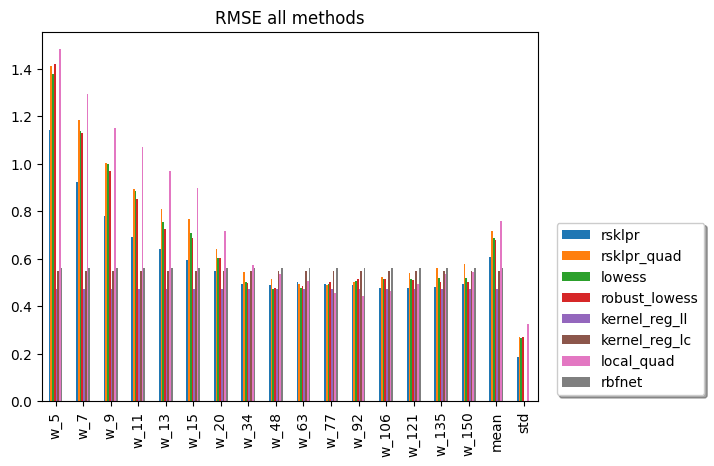

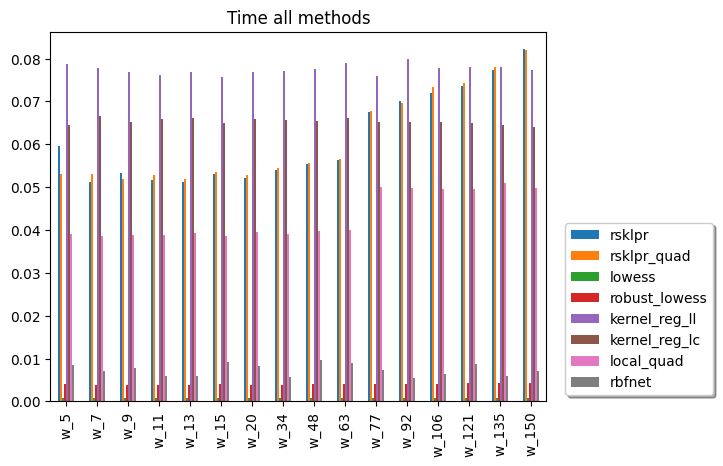

In [30]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_3,
    noise_ratio=medium_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    k2="joint",
    methods=methods,
)

In [31]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,0.471771
w_7,kernel_reg_ll,0.471771
w_9,kernel_reg_ll,0.471771
w_11,kernel_reg_ll,0.471771
w_13,kernel_reg_ll,0.471771
w_15,kernel_reg_ll,0.471771
w_20,kernel_reg_ll,0.471771
w_34,kernel_reg_ll,0.471771
w_48,kernel_reg_ll,0.471771
w_63,kernel_reg_ll,0.471771


In [32]:
worst_for_window

,method,rmse
w_5,local_quad,1.481695
w_7,local_quad,1.294434
w_9,local_quad,1.150125
w_11,local_quad,1.072810
w_13,local_quad,0.968891
w_15,local_quad,0.896290
w_20,local_quad,0.717705
w_34,local_quad,0.574107
w_48,rbfnet,0.561249
w_63,rbfnet,0.561292


### High noise

Best performing method is robust_lowess for size_neighborhood w_150


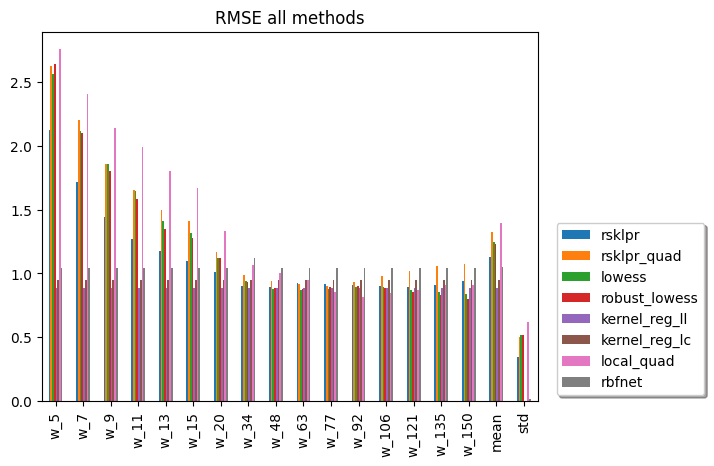

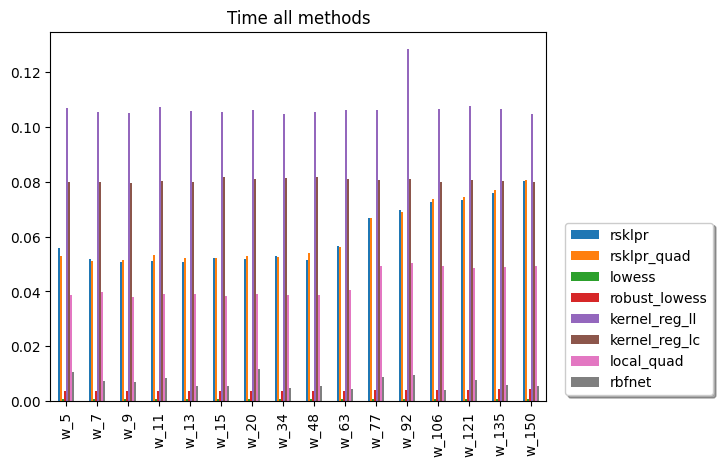

In [33]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_3,
    noise_ratio=high_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    k2="joint",
    methods=methods,
)

In [34]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,0.886265
w_7,kernel_reg_ll,0.886265
w_9,kernel_reg_ll,0.886265
w_11,kernel_reg_ll,0.886265
w_13,kernel_reg_ll,0.886265
w_15,kernel_reg_ll,0.886265
w_20,kernel_reg_ll,0.886265
w_34,kernel_reg_ll,0.886265
w_48,lowess,0.882091
w_63,lowess,0.867078


In [35]:
worst_for_window

,method,rmse
w_5,local_quad,2.751720
w_7,local_quad,2.403955
w_9,local_quad,2.135963
w_11,local_quad,1.992390
w_13,local_quad,1.799464
w_15,local_quad,1.664670
w_20,local_quad,1.332984
w_34,rbfnet,1.118573
w_48,rbfnet,1.042388
w_63,rbfnet,1.042248


### Extreme noise

Best performing method is rsklpr for size_neighborhood w_135


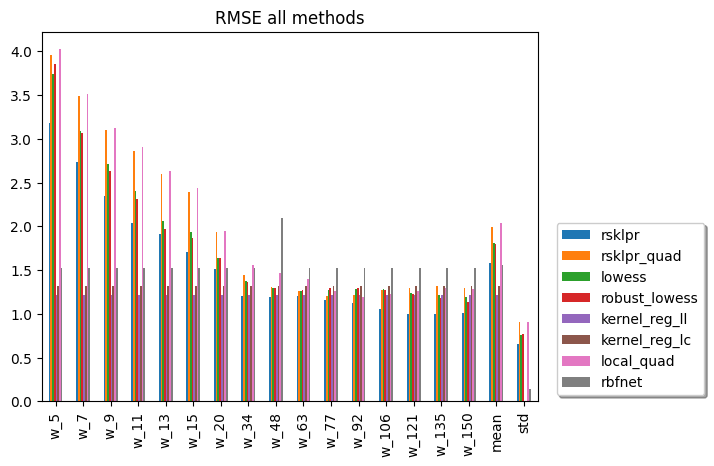

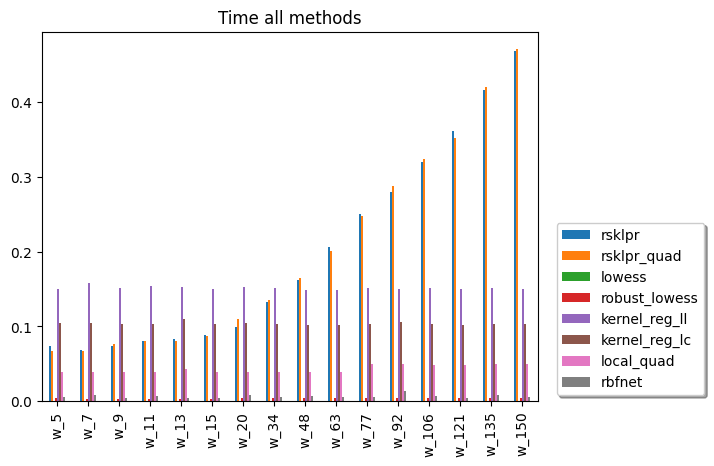

In [36]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_3,
    noise_ratio=extreme_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    k2="conden",
    methods=methods,
)

In [37]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,1.210413
w_7,kernel_reg_ll,1.210413
w_9,kernel_reg_ll,1.210413
w_11,kernel_reg_ll,1.210413
w_13,kernel_reg_ll,1.210413
w_15,kernel_reg_ll,1.210413
w_20,kernel_reg_ll,1.210413
w_34,rsklpr,1.201711
w_48,rsklpr,1.189916
w_63,rsklpr,1.198619


In [38]:
worst_for_window

,method,rmse
w_5,local_quad,4.021745
w_7,local_quad,3.513476
w_9,local_quad,3.121802
w_11,local_quad,2.911969
w_13,local_quad,2.630037
w_15,local_quad,2.433050
w_20,local_quad,1.948264
w_34,local_quad,1.561438
w_48,rbfnet,2.095200
w_63,rbfnet,1.523719


## Curve 4

### Mild noise

Best performing method is rbfnet for size_neighborhood w_121


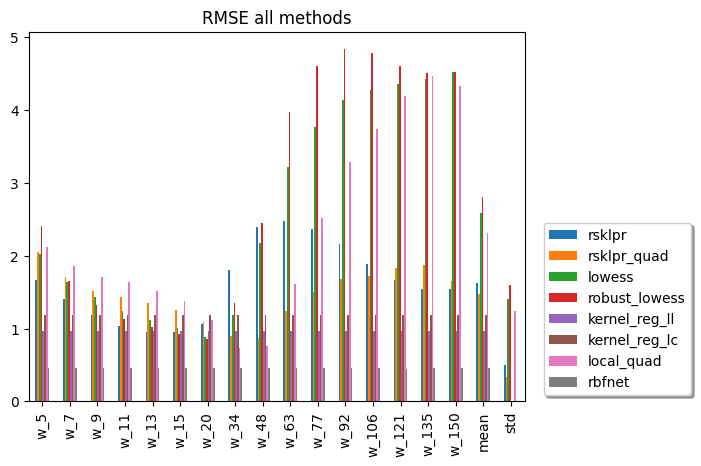

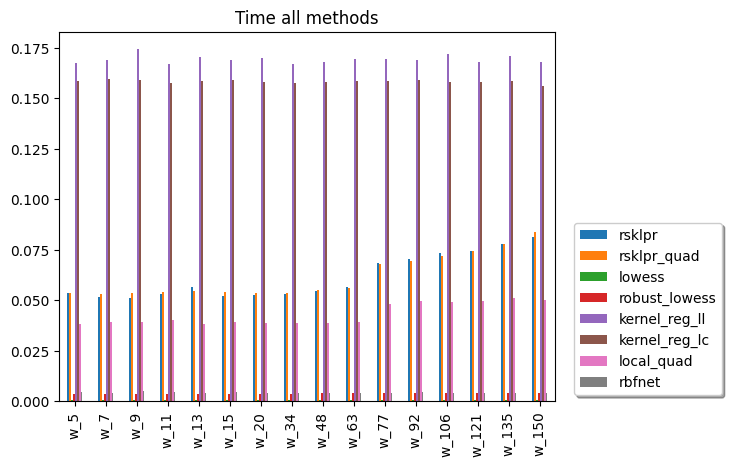

In [39]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_4,
    noise_ratio=mild_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    k2="joint",
    methods=methods,
)

In [40]:
best_for_window

,method,rmse
w_5,rbfnet,0.458594
w_7,rbfnet,0.461480
w_9,rbfnet,0.461478
w_11,rbfnet,0.461470
w_13,rbfnet,0.461513
w_15,rbfnet,0.458939
w_20,rbfnet,0.459928
w_34,rbfnet,0.460509
w_48,rbfnet,0.461272
w_63,rbfnet,0.460690


In [41]:
worst_for_window

,method,rmse
w_5,robust_lowess,2.402554
w_7,local_quad,1.863522
w_9,local_quad,1.709563
w_11,local_quad,1.645411
w_13,local_quad,1.517086
w_15,local_quad,1.378998
w_20,kernel_reg_lc,1.192916
w_34,rsklpr,1.797182
w_48,robust_lowess,2.444189
w_63,robust_lowess,3.971801


### Medium noise

Best performing method is rbfnet for size_neighborhood w_48


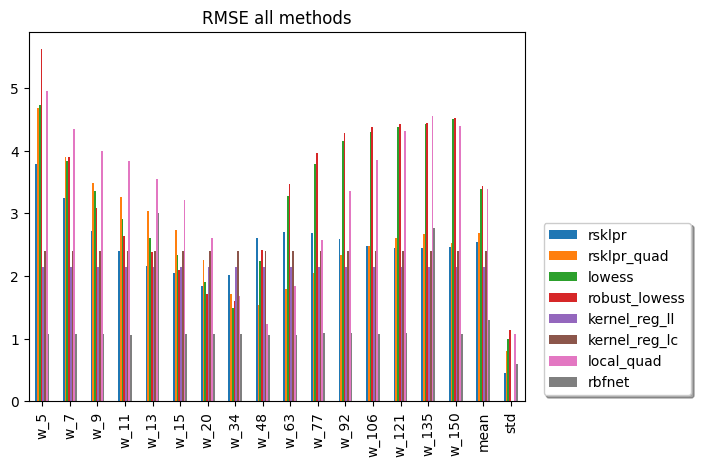

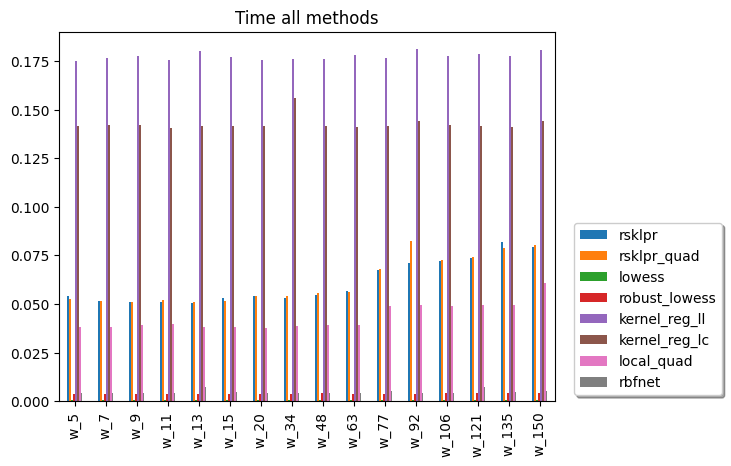

In [42]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_4,
    noise_ratio=medium_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    k2="joint",
    methods=methods,
)

In [43]:
best_for_window

,method,rmse
w_5,rbfnet,1.073356
w_7,rbfnet,1.074237
w_9,rbfnet,1.074012
w_11,rbfnet,1.063254
w_13,kernel_reg_ll,2.137574
w_15,rbfnet,1.075603
w_20,rbfnet,1.070953
w_34,rbfnet,1.073386
w_48,rbfnet,1.063250
w_63,rbfnet,1.064929


In [44]:
worst_for_window

,method,rmse
w_5,robust_lowess,5.612146
w_7,local_quad,4.348442
w_9,local_quad,3.989544
w_11,local_quad,3.839806
w_13,local_quad,3.538863
w_15,local_quad,3.215796
w_20,local_quad,2.611246
w_34,kernel_reg_lc,2.393623
w_48,rsklpr,2.600581
w_63,robust_lowess,3.471449


### High noise

Best performing method is rbfnet for size_neighborhood w_92


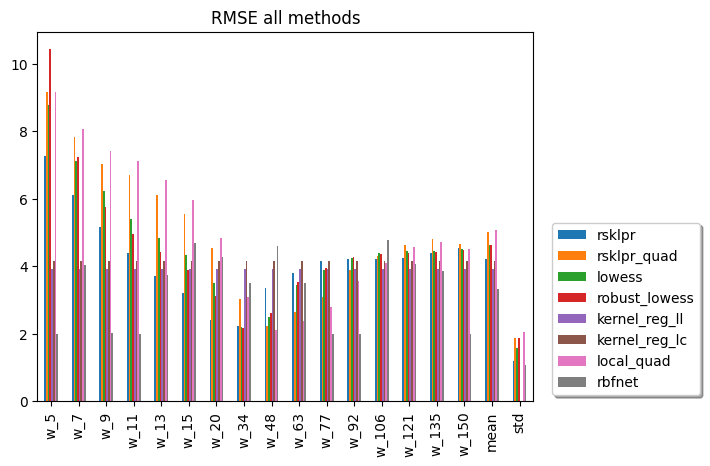

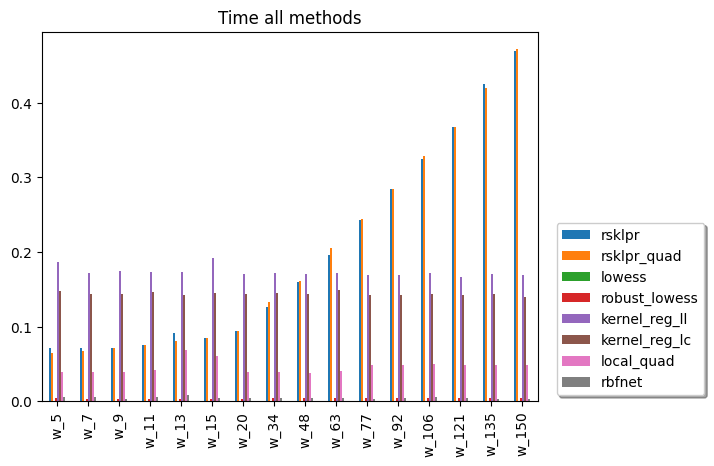

In [45]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_4,
    noise_ratio=high_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    k2="conden",
    methods=methods,
)

In [46]:
best_for_window

,method,rmse
w_5,rbfnet,1.997548
w_7,kernel_reg_ll,3.923847
w_9,rbfnet,2.017784
w_11,rbfnet,2.003214
w_13,rsklpr,3.709036
w_15,rsklpr,3.209381
w_20,rsklpr,2.416470
w_34,robust_lowess,2.166168
w_48,local_quad,2.109163
w_63,local_quad,2.385120


In [47]:
worst_for_window

,method,rmse
w_5,robust_lowess,10.426934
w_7,local_quad,8.075824
w_9,local_quad,7.409516
w_11,local_quad,7.131403
w_13,local_quad,6.571541
w_15,local_quad,5.971022
w_20,local_quad,4.847090
w_34,kernel_reg_lc,4.156707
w_48,rbfnet,4.617271
w_63,kernel_reg_lc,4.156707


### Extreme noise

Best performing method is rsklpr for size_neighborhood w_34


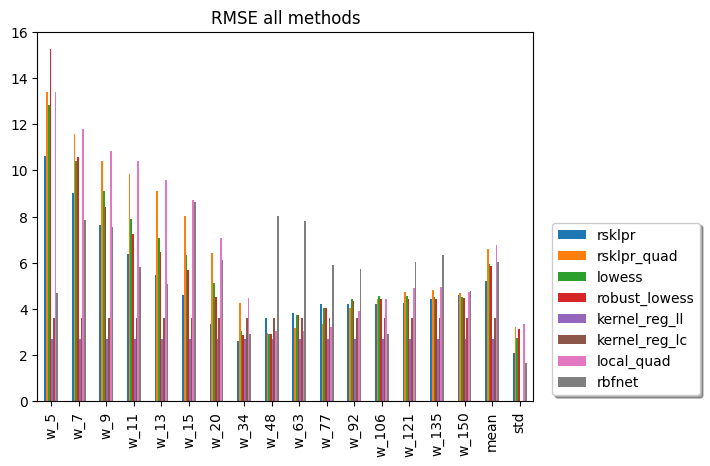

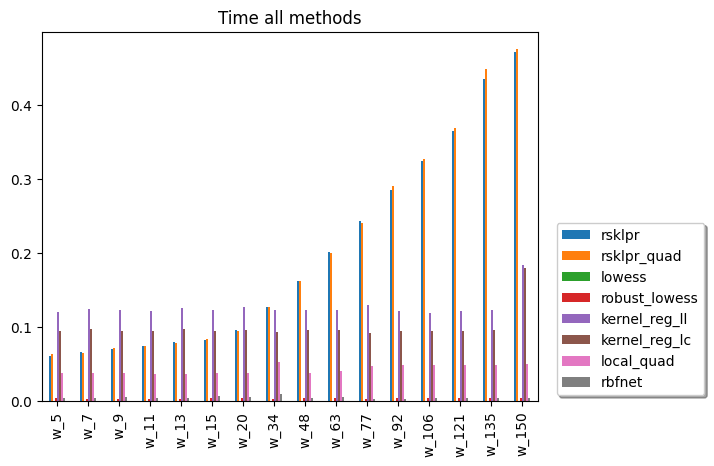

In [48]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_4,
    noise_ratio=extreme_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    k2="conden",
    methods=methods,
)

In [49]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,2.702912
w_7,kernel_reg_ll,2.702912
w_9,kernel_reg_ll,2.702912
w_11,kernel_reg_ll,2.702912
w_13,kernel_reg_ll,2.702912
w_15,kernel_reg_ll,2.702912
w_20,kernel_reg_ll,2.702912
w_34,rsklpr,2.619244
w_48,kernel_reg_ll,2.702912
w_63,kernel_reg_ll,2.702912


In [50]:
worst_for_window

,method,rmse
w_5,robust_lowess,15.241665
w_7,local_quad,11.803205
w_9,local_quad,10.829489
w_11,local_quad,10.423002
w_13,local_quad,9.604222
w_15,local_quad,8.726253
w_20,local_quad,7.082951
w_34,local_quad,4.497998
w_48,rbfnet,8.019144
w_63,rbfnet,7.811758


## Curve 5

### Mild noise

Best performing method is rsklpr for size_neighborhood w_20


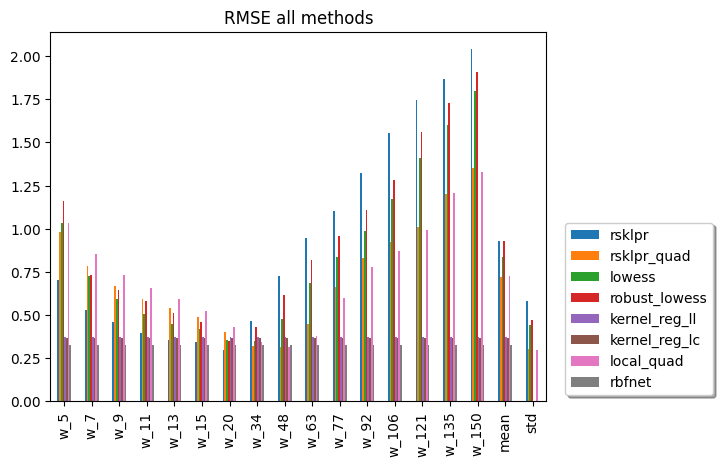

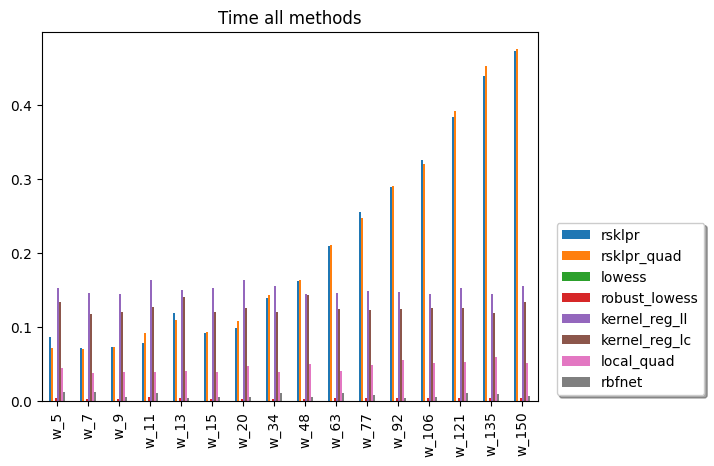

In [51]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_5,
    noise_ratio=mild_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1="scott",
    bw2="scott",
    k2="conden",
    methods=methods,
)

In [52]:
best_for_window

,method,rmse
w_5,rbfnet,0.328877
w_7,rbfnet,0.328721
w_9,rbfnet,0.328508
w_11,rbfnet,0.328928
w_13,rbfnet,0.328941
w_15,rbfnet,0.328477
w_20,rsklpr,0.297937
w_34,rsklpr_quad,0.319000
w_48,local_quad,0.313867
w_63,rbfnet,0.328464


In [53]:
worst_for_window

,method,rmse
w_5,robust_lowess,1.160002
w_7,local_quad,0.855819
w_9,local_quad,0.734577
w_11,local_quad,0.654519
w_13,local_quad,0.594086
w_15,local_quad,0.524815
w_20,local_quad,0.429592
w_34,rsklpr,0.467681
w_48,rsklpr,0.726842
w_63,rsklpr,0.945487


### Medium noise

Best performing method is local_quad for size_neighborhood w_63


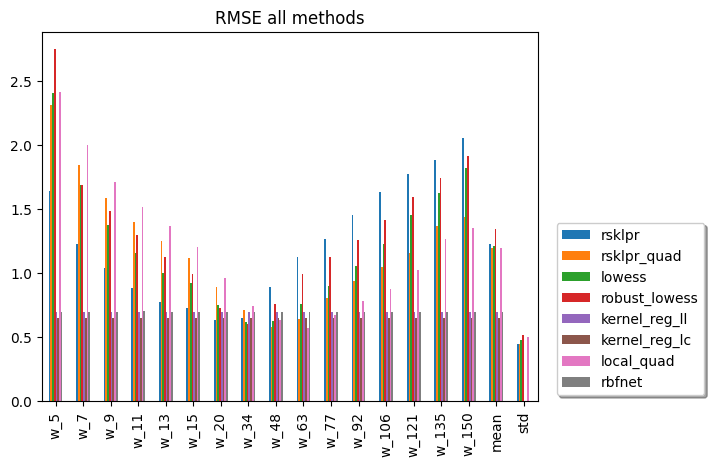

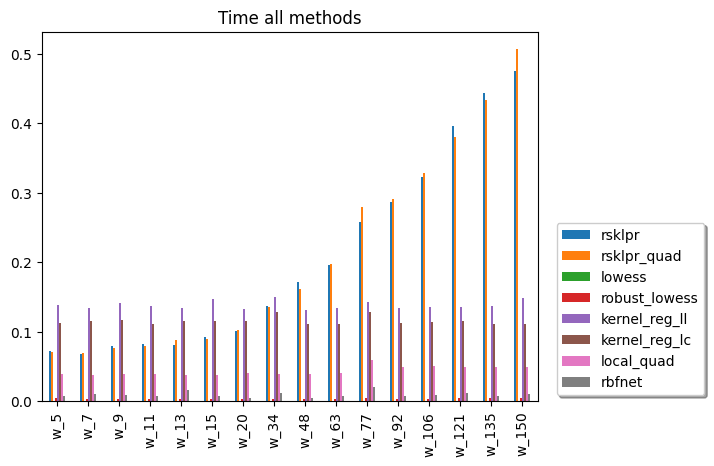

In [54]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_5,
    noise_ratio=medium_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1="scott",
    bw2="scott",
    k2="conden",
    methods=methods,
)

In [55]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.652586
w_7,kernel_reg_lc,0.652586
w_9,kernel_reg_lc,0.652586
w_11,kernel_reg_lc,0.652586
w_13,kernel_reg_lc,0.652586
w_15,kernel_reg_lc,0.652586
w_20,rsklpr,0.635580
w_34,robust_lowess,0.603759
w_48,rsklpr_quad,0.581649
w_63,local_quad,0.573680


In [56]:
worst_for_window

,method,rmse
w_5,robust_lowess,2.742273
w_7,local_quad,1.994888
w_9,local_quad,1.706526
w_11,local_quad,1.511776
w_13,local_quad,1.366894
w_15,local_quad,1.199677
w_20,local_quad,0.958871
w_34,local_quad,0.746010
w_48,rsklpr,0.891016
w_63,rsklpr,1.128282


### High noise

Best performing method is local_quad for size_neighborhood w_92


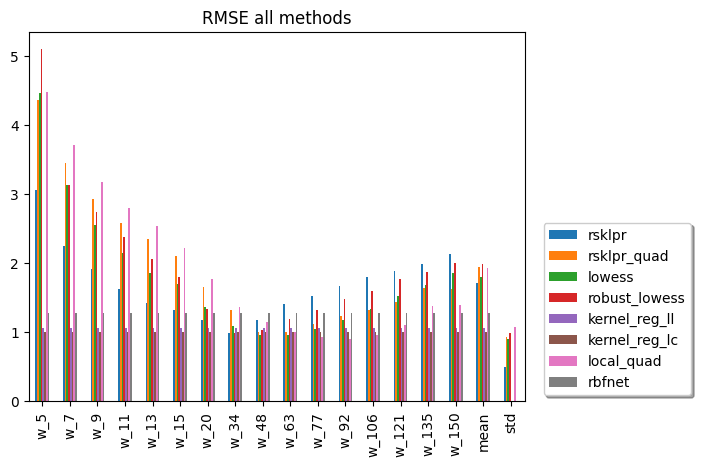

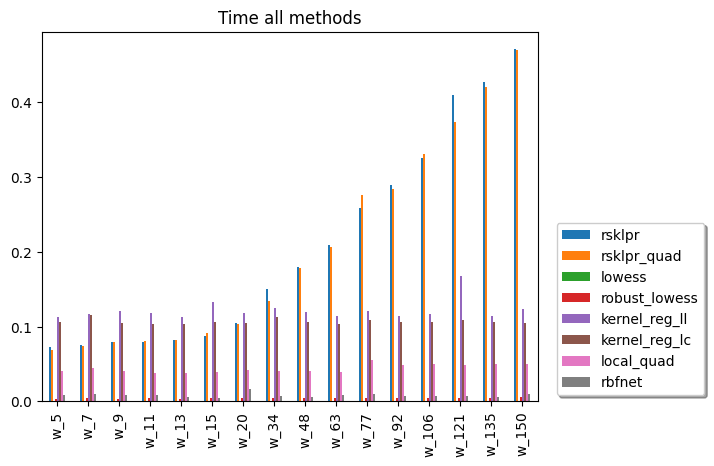

In [57]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_5,
    noise_ratio=high_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1="scott",
    bw2="scott",
    k2="conden",
    methods=methods,
)

In [58]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,1.004060
w_7,kernel_reg_lc,1.004060
w_9,kernel_reg_lc,1.004060
w_11,kernel_reg_lc,1.004060
w_13,kernel_reg_lc,1.004060
w_15,kernel_reg_lc,1.004060
w_20,kernel_reg_lc,1.004060
w_34,robust_lowess,0.991174
w_48,lowess,0.961133
w_63,lowess,0.957182


In [59]:
worst_for_window

,method,rmse
w_5,robust_lowess,5.091435
w_7,local_quad,3.705641
w_9,local_quad,3.167511
w_11,local_quad,2.802098
w_13,local_quad,2.532473
w_15,local_quad,2.220192
w_20,local_quad,1.763895
w_34,local_quad,1.368182
w_48,rbfnet,1.277280
w_63,rsklpr,1.407762


### Extreme noise

Best performing method is local_quad for size_neighborhood w_106


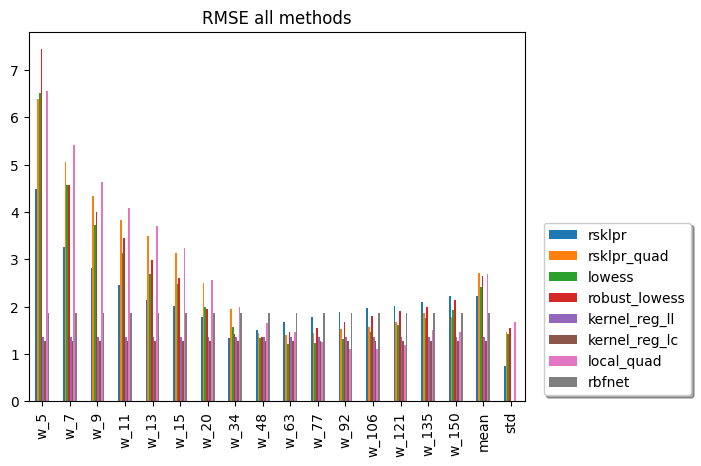

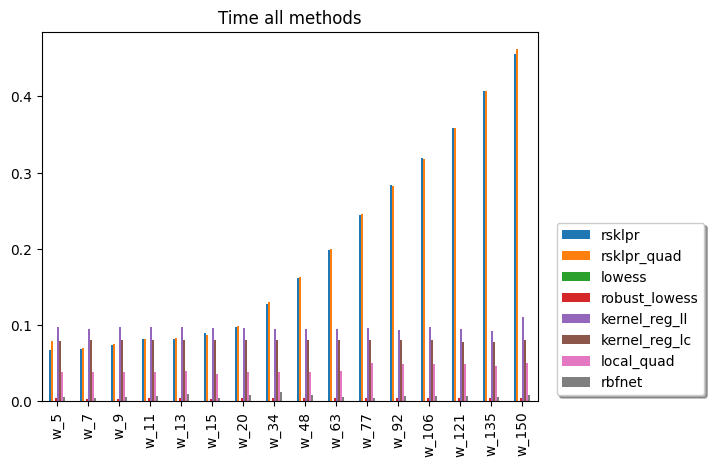

In [60]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_5,
    noise_ratio=extreme_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1="scott",
    bw2="scott",
    k2="conden",
    methods=methods,
)

In [61]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,1.273993
w_7,kernel_reg_lc,1.273993
w_9,kernel_reg_lc,1.273993
w_11,kernel_reg_lc,1.273993
w_13,kernel_reg_lc,1.273993
w_15,kernel_reg_lc,1.273993
w_20,kernel_reg_lc,1.273993
w_34,kernel_reg_lc,1.273993
w_48,kernel_reg_lc,1.273993
w_63,lowess,1.206938


In [62]:
worst_for_window

,method,rmse
w_5,robust_lowess,7.436266
w_7,local_quad,5.416802
w_9,local_quad,4.629079
w_11,local_quad,4.093269
w_13,local_quad,3.699274
w_15,local_quad,3.242297
w_20,local_quad,2.571127
w_34,local_quad,1.994020
w_48,rbfnet,1.861244
w_63,rbfnet,1.863266
